In this notebook, we will try the process of implementing CNN with Keras in order to classify images.

I.   **Firstly**, we'll import useful packages.

II.   **Then**, we'll load the data, before visualize and preprocess it.

III.  **We'll try a simple CNN model** and then we will evaluate its performances.

IV.   **Finally,** we'll use techniques such as data augmentation, learning rate decay and dropout to increase our test F1.

# I. Let import all useful packages.

In [30]:

from tensorflow import keras
import tensorflow as tf   
import tensorflow.keras.layers as Layers
import tensorflow.keras.activations as Actications
import tensorflow.keras.models as Models
import tensorflow.keras.optimizers as Optimizer
import tensorflow.keras.metrics as Metrics
import tensorflow.keras.utils as Utils
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.models import load_model
from tensorflow.keras.callbacks import TensorBoard
import tensorflow_addons as tfa
import os
import random
import datetime
import cv2
import numpy as np
from sklearn.utils import shuffle
from sklearn.metrics import confusion_matrix as CM
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plot
import seaborn as sn
from tqdm import tqdm

/usr/local/lib/python3.7/dist-packages/tensorflow_addons/utils/ensure_tf_install.py:67: UserWarning: Tensorflow Addons supports using Python ops for all Tensorflow versions above or equal to 2.3.0 and strictly below 2.6.0 (nightly versions are not supported). 
 The versions of TensorFlow you are currently using is 2.6.0 and is not supported. 
Some things might work, some things might not.
If you were to encounter a bug, do not file an issue.
If you want to make sure you're using a tested and supported configuration, either change the TensorFlow version or the TensorFlow Addons's version. 
You can find the compatibility matrix in TensorFlow Addon's readme:
https://github.com/tensorflow/addons
  UserWarning,


**Task 1:** Setting Fre GPU in this Google Colab notebook.

[*Hint.*](https://medium.com/deep-learning-turkey/google-colab-free-gpu-tutorial-e113627b9f5d)

In [2]:
import tensorflow as tf
tf.test.gpu_device_name()

'/device:GPU:0'

## Mounting Google Drive locally
**Task 2:** Mount the Google Driver into the Google Colab Driver.

[*Hint.*](https://colab.research.google.com/notebooks/io.ipynb#scrollTo=eikfzi8ZT_rW)

In [3]:
## TYPE YOUR CODE for task 2 here:
from google.colab import drive
from pathlib import Path
drive.mount('/content/gdrive')

Mounted at /content/gdrive


**Task 3**: Copy the zip dataset from Google Drive into Colab, then unzip it and finally remove the zip file to free up space.

[*Hint.*](https://medium.com/datadriveninvestor/speed-up-your-image-training-on-google-colab-dc95ea1491cf)

In [4]:
## TYPE YOUR CODE for task 3 here:
# 
%%time
base = Path('/content/gdrive/MyDrive/Colab Notebooks/Assignment/Assignment 1/Dataset/')
zip_path = base/'image-classification.zip'
!cp '{zip_path}' .
!unzip -q image-classification.zip
!rm image-classification.zip

CPU times: user 97.1 ms, sys: 66.6 ms, total: 164 ms
Wall time: 12.5 s


# II. Load the data.

## About dataset.
This is image data of Natural Scenes around the world.
This Data contains around 25k images of size 150x150 distributed under 6 categories. {'buildings' -> 0, 'forest' -> 1, 'glacier' -> 2, 'mountain' -> 3, 'sea' -> 4, 'street' -> 5 }

The Train, Test and Prediction data is separated in each zip files. There are around 14k images in Train, 3k in Test.


Now, We need to prepare our data to feed into the model. There is a builtin method in Keras that can extract your images from folder.

Following is the gernalized functions used to extract data from the directory.

In [5]:
# Here's our 6 categories that we have to classify.
%%time
class_names = ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']
class_names_label = {'buildings': 0,
                    'forest' : 1,
                    'glacier' : 2,
                    'mountain' : 3,
                    'sea' : 4,
                    'street' : 5
                    }
nb_classes = 6
IMAGE_SIZE = (150, 150)

CPU times: user 5 µs, sys: 0 ns, total: 5 µs
Wall time: 22.9 µs


## Loading the Data

**Task 4:** We have to write a load_data function that load the training and test data ( which contain images and the labels) from the folder.

* **Load_data** function return **train_set** and **test_set**. Each set contains **images and labels**.
* Apply 2 augmentation transformations (**shear_range** = 0.2, **zoom_range** = 0.2), shuffle with seed = 8 and rescaling function( to [0, 1]) to **train_set.**
* Apply rescaling funtion to [0, 1]  to **test_set**, no shuffle.
* Batch size = 32.



[*Hint.*](https://keras.io/preprocessing/image/)


In [7]:
train_datagen = ImageDataGenerator(shear_range = 0.2, zoom_range = 0.2, rescale=1./255)
train_generator = train_datagen.flow_from_directory('/content/seg_train/seg_train',
                                                    batch_size=32,
                                                    seed=8)

Found 14034 images belonging to 6 classes.


In [8]:
train_datagen = ImageDataGenerator(rescale=1./255)
train_generator = train_datagen.flow_from_directory('/content/seg_test/seg_test',
                                                    batch_size=32)

Found 3000 images belonging to 6 classes.


In [15]:
%%time
def load_data(data_directories):
    """
        Load the data:
            - 14,034 images to train the network.
            - 3000 images to evaluate how accurately the network learned to classify images.
        Input:
            Data directory.
        Return: 
            training_set, testing_set.
    """
    ## TYPE YOUR CODE for task 4 here:
    train_datagen = ImageDataGenerator(shear_range = 0.2, zoom_range = 0.2, rescale=1./255)
    training_set = train_datagen.flow_from_directory(
        '/content' + data_directories[0],
        target_size = (150, 150),
        batch_size=32,
        seed=8)
    
    test_datagen = ImageDataGenerator(rescale=1./255)
    testing_set = test_datagen.flow_from_directory(
        '/content' + data_directories[1],
        target_size = (150, 150),
        batch_size=32,
        shuffle=False)

    return training_set, testing_set


data_directories = ['/seg_train/seg_train', '/seg_test/seg_test']
train_dataset, test_dataset = load_data(data_directories)

Found 14034 images belonging to 6 classes.
Found 3000 images belonging to 6 classes.
CPU times: user 362 ms, sys: 25.5 ms, total: 388 ms
Wall time: 440 ms


## Let's explore the dataset.
We can, for example, ask ourselves:

* How many training and testing examples do we have ?
* What is the size of the images ?
* What is the proportion of each observed category ?

As you see, The Training data is in shape of (Number of Training Images, Width of image, Height of image, Channel of image). This shape is very important. If you didnot resize the images to same size. It should be (No. of images,) shape. So, using this shape you cant feed the images to the model.


**Task 5:** Print out:

*  Number of training examples.
*  Number of testing examples.
* Size of each image.



In [17]:
## TYPE YOUR CODE for task 5 here:
print("Number of training examples: ", train_dataset.samples)
print("Number of testing examples: ", test_dataset.samples)
print("Each image is of size: ", train_dataset.image_shape)

Number of training examples:  14034
Number of testing examples:  3000
Each image is of size:  (150, 150, 3)


**Task 6:** Plot a pie chart of the proportion of each class.
You need to show the name and proportion of each class on the pie chart.

*Hint:* [plot.pie](https://matplotlib.org/3.1.1/gallery/pie_and_polar_charts/pie_features.html#sphx-glr-gallery-pie-and-polar-charts-pie-features-py)

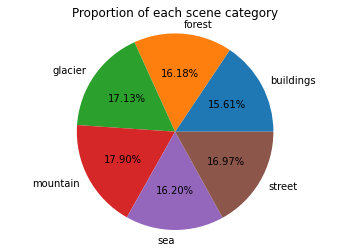

CPU times: user 280 ms, sys: 1.03 ms, total: 281 ms
Wall time: 280 ms


In [21]:
%%time

import matplotlib.pyplot as plt

def plot_pie(train_dataset, class_names):
    ## TYPE YOUR CODE for task 6 here:
    labels = train_dataset.labels
    sizes = []
    for i in range(len(class_names)):
      size = 100.0 * sum(labels == i) / len(labels)
      sizes.append(round(size, 2))
    
    fig, ax = plt.subplots()
    ax.pie(sizes, labels=class_names, autopct='%1.2f%%')
    ax.axis('equal')
    ax.set_title("Proportion of each scene category")

    plt.show()

plot_pie(train_dataset, class_names)

**Task 7**: Display the 36 random images from the training set.

* Each class contain 6 random images.
* Bellow the image, show the class it belongs to.

*Hint*: [plot.imshow](https://matplotlib.org/3.1.0/gallery/images_contours_and_fields/image_demo.html)

CPU times: user 605 ms, sys: 23.1 ms, total: 628 ms
Wall time: 628 ms


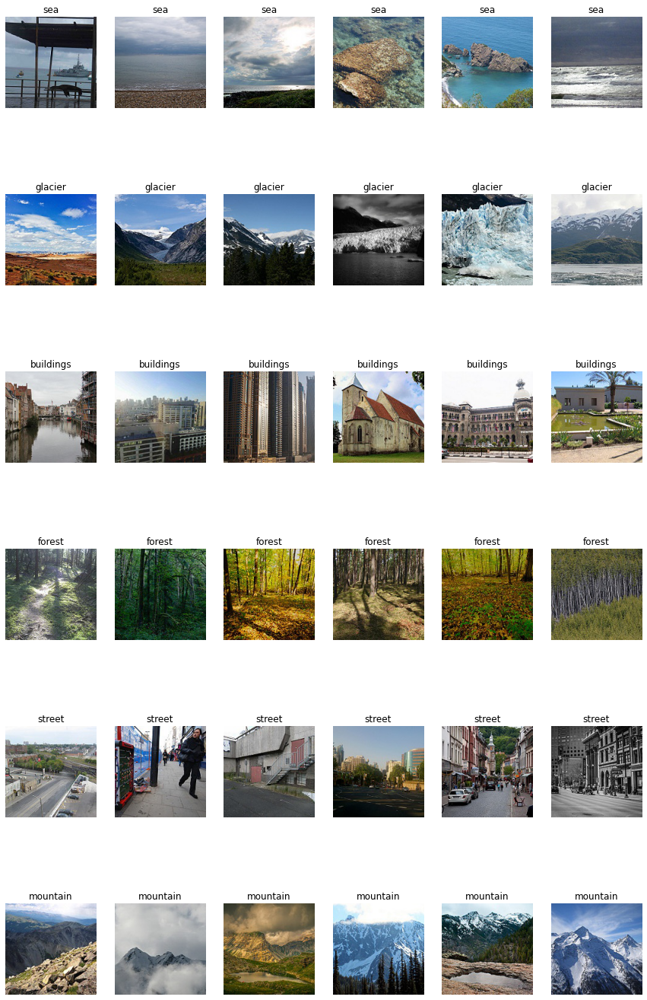

In [26]:
%%time
import os
import random
import matplotlib.image as mpimg

def visualize_image(train_directory):
    ## TYPE YOUR CODE for task 7 here:
    fig, ax = plt.subplots(6, 6, figsize=(15, 25))
    for i,dir in enumerate(os.listdir(train_directory)):
        path = train_directory + dir
        random_imgs = random.sample(os.listdir(path), 6)
        for j in range(len(random_imgs)):
            img = mpimg.imread(path+'/'+random_imgs[j])
            ax[i, j].imshow(img)
            ax[i, j].set_title(dir)
            ax[i, j].axis('off')    

train_directory = '/content/seg_train/seg_train/'
visualize_image(train_directory)

# III. Modelling
## There are some steps we need to finish:
* Build the model.

* Compile the model.

* Train / fit the data to the model.

* Evaluate the model on the testing set.


## Build the model
We can build an easy model composed of different layers such as:

* [Conv2D](https://www.tensorflow.org/api_docs/python/tf/keras/layers/Conv2D).

* [MaxPooling2D:](https://www.tensorflow.org/api_docs/python/tf/keras/layers/MaxPool2D) The images get smaller sized.

* [Flatten:](https://www.tensorflow.org/api_docs/python/tf/keras/layers/Flatten) Transforms the format of the images from a 2d-array to a 1d-array of 150 150 3 pixel values.

* [Relu:](https://www.tensorflow.org/api_docs/python/tf/keras/layers/ReLU) given a value x, returns max(x, 0).

* [Softmax:](https://www.tensorflow.org/api_docs/python/tf/keras/layers/Softmax) 6 neurons, probability that the image belongs to one of the classes.

* [Dense.](https://www.tensorflow.org/api_docs/python/tf/keras/layers/Dense)

* [Dropout.](https://www.tensorflow.org/api_docs/python/tf/keras/layers/Dropout)

**Task 8**: Buil a model, which contain these layers:
- Layer 1: Conv2D, 8 filters, kernel_size = (3, 3), activation = 'relu', input_shape = image_shape, same padding.
- Layer 2: Conv2D, 16 filters, kernel_size = (3, 3), activation = 'relu', same padding.
- Layer 3: MaxPooling2D, pooling size = (2, 2).
- Layer 4: Conv2D, 32 filters, kernel_size = (3, 3), activation = 'relu', same padding.
- Layer 5: Conv2D, 64 filters, kernel_size = (3, 3), activation = 'relu', same padding.
- Layer 6: MaxPooling2D, pooling size = (3, 3).
- Layer 7: Conv2D, 128 filters, kernel_size = (3, 3), activation = 'relu', same padding.
- Layer 8: Conv2D, 256 filters, kernel_size = (3, 3), activation = 'relu', same padding.
- Layer 9: MaxPooling2D, pooling size = (5, 5).
- Layer 10: Flatten.
- Layer 11: Dense with number of unit = 100, activation = 'relu'.
- Layer 12: Dropout with probs = 0.5.
- Layer 13: Final dense with number of unit = number of class, activation = 'softmax'.



All the Conv2D and Dense layers are followed by a Batch Norm layer with customized configuration excepts from the last dense layer:

- momentum=0.95 
- epsilon=0.005
- beta_initializer = RandomNormal with mean = 0 and stddev = 0.05
- gammaa_initializer = Constant with value = 0.9


In [27]:
%%time

import tensorflow as tf
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, ReLU, Softmax, Dense, Dropout, BatchNormalization

def create_model():
    '''
    Return: 
        CNN model with 13 layers.
    '''
    ## TYPE YOUR CODE for task 8 here:
    model = Sequential([
                        Conv2D(8, kernel_size=(3,3), activation='relu', 
                               input_shape=train_dataset.image_shape, padding='same'),
                        BatchNormalization(momentum=0.95, epsilon=0.005, 
                                           beta_initializer=tf.keras.initializers.RandomNormal(0, 0.005), 
                                           gamma_initializer=tf.keras.initializers.Constant(0.9)),
                        Conv2D(16, kernel_size=(3,3), 
                               activation='relu', padding='same'),
                        BatchNormalization(momentum=0.95, epsilon=0.005, 
                                           beta_initializer=tf.keras.initializers.RandomNormal(0, 0.005), 
                                           gamma_initializer=tf.keras.initializers.Constant(0.9)),
                        MaxPooling2D(pool_size=(2,2)),
                        Conv2D(32, kernel_size=(3,3), 
                               activation='relu', padding='same'),
                        BatchNormalization(momentum=0.95, epsilon=0.005, 
                                           beta_initializer=tf.keras.initializers.RandomNormal(0, 0.005), 
                                           gamma_initializer=tf.keras.initializers.Constant(0.9)),
                        Conv2D(64, kernel_size=(3,3), 
                               activation='relu', padding='same'),
                        BatchNormalization(momentum=0.95, epsilon=0.005, 
                                           beta_initializer=tf.keras.initializers.RandomNormal(0, 0.005), 
                                           gamma_initializer=tf.keras.initializers.Constant(0.9)),
                        MaxPooling2D(pool_size=(3,3)),
                        Conv2D(128, kernel_size=(3,3), 
                               activation='relu', padding='same'),
                        BatchNormalization(momentum=0.95, epsilon=0.005, 
                                           beta_initializer=tf.keras.initializers.RandomNormal(0, 0.005), 
                                           gamma_initializer=tf.keras.initializers.Constant(0.9)),
                        Conv2D(256, kernel_size=(3,3), activation='relu', padding='same'),
                        BatchNormalization(momentum=0.95, epsilon=0.005, 
                                           beta_initializer=tf.keras.initializers.RandomNormal(0, 0.005), 
                                           gamma_initializer=tf.keras.initializers.Constant(0.9)),
                        MaxPooling2D(pool_size=(5,5)),
                        Flatten(),
                        Dense(100, activation='relu'),
                        BatchNormalization(momentum=0.95, epsilon=0.005, 
                                           beta_initializer=tf.keras.initializers.RandomNormal(0, 0.005), 
                                           gamma_initializer=tf.keras.initializers.Constant(0.9)),
                        Dropout(rate=0.5),
                        Dense(nb_classes, activation='softmax')

    ])

    return model
model = create_model()

CPU times: user 199 ms, sys: 14.5 ms, total: 214 ms
Wall time: 288 ms


**Task 9:** Compile the model. Then print out the model summary.
* [Compile](https://keras.io/models/model/#compile) the model with Adam Optimizaer, lr = 1e-4, categorical-crossentroy loss and "[F1 score](https://github.com/tensorflow/addons/issues/825)" as metric.
* Print out the model F1.

In [28]:
%%time
!pip install tensorflow-addons==0.13.0

     |████████████████████████████████| 679 kB 5.4 MB/s 
CPU times: user 47.5 ms, sys: 59.8 ms, total: 107 ms
Wall time: 4.35 s


In [31]:
%%time
def optimize(model):
    '''
    Input: 
        Model.
    Return: 
        Complied model.
    '''
    ## TYPE YOUR CODE for task 9 here:
    f1 = tfa.metrics.FBetaScore(num_classes=nb_classes, average='micro')
    model.compile(optimizer=Optimizer.Adam(learning_rate=0.0001),loss='categorical_crossentropy',metrics=[f1])
    
    return model

model = optimize(model)
print(model.summary())

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 150, 150, 8)       224       
_________________________________________________________________
batch_normalization (BatchNo (None, 150, 150, 8)       32        
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 150, 150, 16)      1168      
_________________________________________________________________
batch_normalization_1 (Batch (None, 150, 150, 16)      64        
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 75, 75, 16)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 75, 75, 32)        4640      
_________________________________________________________________
batch_normalization_2 (Batch (None, 75, 75, 32)        1

**Task 10**: Setup callback.
* Create the [tensorboard callback](https://www.tensorflow.org/tensorboard/tensorboard_in_notebooks) to save the logs.
* Create the [checkpoint callback](https://machinelearningmastery.com/check-point-deep-learning-models-keras/) to save the checkpoint with the best F1 after each epoch. 
* Create the [ReduceLROnPlateau callback](https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/ReduceLROnPlateau) to reduce learning rate when the validation F1 score has stopped improving with the factor of 0.1 and patience = 2.

In [34]:
%load_ext tensorboard

In [32]:
%%time
# dùng để test phần trend có bị hội tụ hay ko
from tensorflow.keras.callbacks import TensorBoard, ModelCheckpoint, ReduceLROnPlateau

def callback_model(checkpoint_name, logs_name):
    '''
    Input: 
        Best checkpoint name, logs name.
    Return: 
        Callback list, which contains tensorboard callback and checkpoint callback.
    '''
    ## TYPE YOUR CODE for task 10 here:
    tensorboard_callback = TensorBoard(logs_name, histogram_freq=1)
    checkpoint = ModelCheckpoint(filepath = checkpoint_name,
                                 save_weights_only = True,
                                 monitor = 'val_fbeta_score',
                                 save_best_only = True,
                                 mode = 'max',
                                 verbose = 1)
    reduce_lr = ReduceLROnPlateau(monitor='val_fbeta_score', factor=0.1, patience=2, verbose=1)
    callbacks_list = [tensorboard_callback, checkpoint, reduce_lr]

    return callbacks_list

checkpoint_name = os.path.join('/content/model/', 'weights.best.hdf5')
logs_name = os.path.join('/content/model/', 'training_logs')
callbacks_list = callback_model(checkpoint_name, logs_name)

CPU times: user 76.5 ms, sys: 42.4 ms, total: 119 ms
Wall time: 220 ms


**Task 11:** Train the model.

**Requirement:** 
* Train the model with 10 epochs, generator = train_dataset, validataion_data = test_dataset.
* Return the model with best-checkpoint weights.

*Hint:*
[Fit](https://keras.io/models/sequential/#fit_generator) the model first, then reload the model ([load_model function](https://keras.io/getting-started/faq/)) with best-checkpoint weights.

In [33]:
%%time
def train_model(model, callbacks_list):
    '''
    Input: 
        Model and callback list,
    Return: 
        Model with best-checkpoint weights.
    '''
    ## TYPE YOUR CODE for task 11 here:
    model.fit(train_dataset,
              epochs=10,
              validation_data=test_dataset,
              batch_size=32,
              callbacks=callbacks_list,
              verbose=1)
    
    model = create_model()
    model.load_weights(os.path.join('/content/model/', checkpoint_name))
    model = optimize(model)
    return model

model = train_model(model, callbacks_list)

Epoch 1/10
439/439 [==============================] - ETA: 0s - loss: 1.0715 - fbeta_score: 0.6119

/usr/local/lib/python3.7/dist-packages/keras/metrics.py:257: UserWarning: Metric FBetaScore implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  'consistency.' % (self.__class__.__name__,))


439/439 [==============================] - 136s 234ms/step - loss: 1.0715 - fbeta_score: 0.6119 - val_loss: 0.8258 - val_fbeta_score: 0.7063

Epoch 00001: val_fbeta_score improved from -inf to 0.70633, saving model to /content/model/weights.best.hdf5
Epoch 2/10
439/439 [==============================] - 100s 228ms/step - loss: 0.7788 - fbeta_score: 0.7215 - val_loss: 0.6180 - val_fbeta_score: 0.7840

Epoch 00002: val_fbeta_score improved from 0.70633 to 0.78400, saving model to /content/model/weights.best.hdf5
Epoch 3/10
439/439 [==============================] - 103s 235ms/step - loss: 0.6829 - fbeta_score: 0.7582 - val_loss: 0.5955 - val_fbeta_score: 0.7930

Epoch 00003: val_fbeta_score improved from 0.78400 to 0.79300, saving model to /content/model/weights.best.hdf5

Epoch 00003: ReduceLROnPlateau reducing learning rate to 9.999999747378752e-06.
Epoch 4/10
439/439 [==============================] - 103s 235ms/step - loss: 0.6006 - fbeta_score: 0.7908 - val_loss: 0.5518 - val_fbeta_

**Task 12**: [Show the tensorboard](https://www.tensorflow.org/tensorboard/tensorboard_in_notebooks) in the notebook.

In [35]:
## TYPE YOUR CODE for task 12 here:
%%time
!kill 485

%tensorboard --logdir /content/model/training_logs

/bin/bash: line 0: kill: (485) - No such process


<IPython.core.display.Javascript object>

CPU times: user 34.7 ms, sys: 103 ms, total: 138 ms
Wall time: 4.33 s


**Task 13:** Prediction on test set.
* Complete the get_prediction_classes function.
* Print out the test F1. 

In [36]:
%%time
def get_prediction_classes(model, prediction_dataset):
    ## TYPE YOUR CODE for task 13 here:
    '''
    Input: 
        Model and prediction dataset.
    Return: 
        Prediction list and groundtrurth list with predicted classes.
    '''
    predictions = np.argmax(model.predict(prediction_dataset, verbose=0), axis=-1)
    groundtruth = prediction_dataset.labels
    loss, f1score = model.evaluate(prediction_dataset, verbose=0)
    print("Test F1: ", f1score)

    return predictions, groundtruth

test_predictions, test_groundtruths = get_prediction_classes(model, test_dataset)

Test F1:  0.8220000267028809
CPU times: user 8.62 s, sys: 3.27 s, total: 11.9 s
Wall time: 10.5 s


**Task 14:** Perform the predicted result on test set using confusion matrix.
Remember to show the class name in the confusion matrix. 

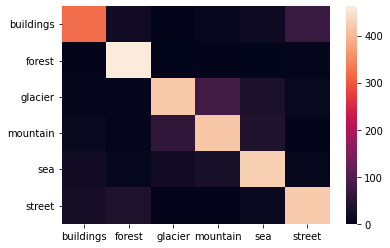

In [37]:
import pandas as pd

def plot_confusion_matrix(predictions, groundtruth, class_names):
    ## TYPE YOUR CODE for task 14 here:
    cm = confusion_matrix(groundtruth, predictions)
    df_cm = pd.DataFrame(cm, index=class_names, columns=class_names)
    sn.heatmap(df_cm)

plot_confusion_matrix(test_predictions, test_groundtruths, class_names)

**Task 15**: Model finetuning - fine tune the model using some of these approachs:
* Increase max epochs, change batch size.
* Play around with CNN, Dense and Dropoutlayers (add/# units/etc).
* Increase data augmentation transformations.
* Try to use a [pretrained model](https://www.tensorflow.org/api_docs/python/tf/keras/applications) on Keras.

Requirement: The val_best_F1 should be higher than 87%.

In [38]:
train_dataset.image_shape

(150, 150, 3)

In [39]:
## TYPE YOUR CODE for task 15 here:
%%time

from tensorflow.keras.applications import ResNet50

base_model = ResNet50(weights='imagenet',
                            include_top = False,
                            input_shape = train_dataset.image_shape)
pretrained_model = Sequential([base_model,
                               Flatten(),
                               Dense(100, activation='relu'),
                               BatchNormalization(momentum=0.95, epsilon=0.005, 
                                                beta_initializer=tf.keras.initializers.RandomNormal(0, 0.005), 
                                                gamma_initializer=tf.keras.initializers.Constant(0.9)),
                               Dropout(rate=0.5),
                               Dense(nb_classes, activation='softmax')])

f1 = tfa.metrics.FBetaScore(num_classes=nb_classes, average='micro')
pretrained_model.compile(optimizer=Optimizer.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=[f1])

94781440/94765736 [==============================] - 1s 0us/step
CPU times: user 2.61 s, sys: 647 ms, total: 3.26 s
Wall time: 3.31 s


In [40]:
%%time
pretrained_model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
resnet50 (Functional)        (None, 5, 5, 2048)        23587712  
_________________________________________________________________
flatten_2 (Flatten)          (None, 51200)             0         
_________________________________________________________________
dense_4 (Dense)              (None, 100)               5120100   
_________________________________________________________________
batch_normalization_14 (Batc (None, 100)               400       
_________________________________________________________________
dropout_2 (Dropout)          (None, 100)               0         
_________________________________________________________________
dense_5 (Dense)              (None, 6)                 606       
Total params: 28,708,818
Trainable params: 28,655,498
Non-trainable params: 53,320
_____________________________________

In [41]:
!mkdir /content/pretrained_model/

In [42]:
%%time
checkpoint_name = os.path.join('/content/pretrained_model/', 'weights.best.hdf5')
logs_name = os.path.join('/content/pretrained_model/', 'training_logs')
callbacks_list = callback_model(checkpoint_name, logs_name)

pretrained_model.fit(train_dataset,
              epochs=5,
              validation_data=test_dataset,
              batch_size=32,
              callbacks=callbacks_list,
              verbose=1)

/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 1/5
439/439 [==============================] - ETA: 0s - loss: 0.4582 - fbeta_score: 0.8510

/usr/local/lib/python3.7/dist-packages/keras/metrics.py:257: UserWarning: Metric FBetaScore implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  'consistency.' % (self.__class__.__name__,))


439/439 [==============================] - 207s 451ms/step - loss: 0.4582 - fbeta_score: 0.8510 - val_loss: 1.7030 - val_fbeta_score: 0.2920

Epoch 00001: val_fbeta_score improved from -inf to 0.29200, saving model to /content/pretrained_model/weights.best.hdf5
Epoch 2/5
439/439 [==============================] - 193s 440ms/step - loss: 0.2292 - fbeta_score: 0.9218 - val_loss: 0.4023 - val_fbeta_score: 0.8570

Epoch 00002: val_fbeta_score improved from 0.29200 to 0.85700, saving model to /content/pretrained_model/weights.best.hdf5
Epoch 3/5
439/439 [==============================] - 193s 440ms/step - loss: 0.1582 - fbeta_score: 0.9478 - val_loss: 0.2387 - val_fbeta_score: 0.9260

Epoch 00003: val_fbeta_score improved from 0.85700 to 0.92600, saving model to /content/pretrained_model/weights.best.hdf5

Epoch 00003: ReduceLROnPlateau reducing learning rate to 9.999999747378752e-06.
Epoch 4/5
439/439 [==============================] - 193s 440ms/step - loss: 0.0935 - fbeta_score: 0.9702 -

In [49]:
%%time
pretrained_model.evaluate(test_dataset)

 1/94 [..............................] - ETA: 20s - loss: 0.1682 - fbeta_score: 0.9375

/usr/local/lib/python3.7/dist-packages/keras/metrics.py:257: UserWarning: Metric FBetaScore implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  'consistency.' % (self.__class__.__name__,))


94/94 [==============================] - 13s 134ms/step - loss: 0.2088 - fbeta_score: 0.9367
CPU times: user 7.78 s, sys: 586 ms, total: 8.37 s
Wall time: 12.8 s


[0.20876455307006836, 0.9366666674613953]